#**Trabalho 1 - Matemática Aplicada**


## **Trabalho de Matemática Aplicada MAI5002 - Resolução de Grafos com Sistemas Lineares**

Considere os arquivos manh.el e manh.xy que fornecem as arestas e as coordenadas dos vértices do grafo de ruas da ilha de Manhattan, NY.

O grafo de ruas possui diversas componentes conexas. Considerando somente a maior componente conexa, você deve realizar as seguintes tarefas:

Selecione alguns vértices do grafo
𝑣
𝑖
1
,
𝑣
𝑖
2
,
…
,
𝑣
𝑖
𝑘
v
i1
​
 ,v
i2
​
 ,…,v
ik
​
 , onde
𝑘
≪
𝑛
k≪n (
𝑛
n é o número de vértices na maior componente do grafo e
𝑘
k é um número bem menor que
𝑛
n, por exemplo
𝑘
=
10
k=10) e atribua valores distintos
𝑐
𝑖
1
,
𝑐
𝑖
2
,
…
,
𝑐
𝑖
𝑘
c
i1
​
 ,c
i2
​
 ,…,c
ik
​
  a cada um dos vértices selecionados (por exemplo, valores no intervalo
(
0
,
10
]
(0,10]).

Construa a matriz Laplaciana
𝐿
L do grafo de ruas.

Construa a matriz de penalidades
𝑃
P, sendo
𝑃
P uma matriz diagonal onde a entrada
𝑃
𝑗
𝑗
=
𝛼
P
jj
​
 =α se
𝑗
j corresponde ao índice de algum dos vértices escolhidos no item 1 acima (
𝛼
=
1.0
×
1
0
7
α=1.0×10
7
  por exemplo), e
𝑃
𝑖
𝑖
=
0
P
ii
​
 =0 caso contrário.

Construa um vetor
𝑏
b da seguinte forma:

𝑏
𝑗
=
𝑐
𝑖
𝑠
se
𝑗
=
𝑖
𝑠
e
0
caso contr
a
ˊ
rio
b
j
​
 =c
is
​
 sej=i
s
​
 e0caso contr
a
ˊ
 rio
Compare o tempo de solução do sistema:

(
𝐿
+
𝑃
)
𝑥
=
𝑃
𝑏
(L+P)x=Pb
para os métodos:

Decomposição LU
Cholesky
Jacobi e Gauss-Seidel
Gradientes Conjugados


# Instalando e Importando as Bibliotecas

In [3]:
#############################################
#HEADER
#############################################
#NAME: MATHIAS BREM GARCIA
#USP NUMBER: 10275375 - 2024
#COURSE CODE: MAI5002
#############################################
#
#INSTALL LIBS
!sudo apt-get install  libsuitesparse-dev
!pip install scikit-sparse
!pip install folium
#IMPORT LIBS
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import cg, splu
from sksparse.cholmod import cholesky
from scipy.linalg import qr
import seaborn as sns
import time
import math
import gdown
import random
from folium.plugins import HeatMap
import folium

import tracemalloc

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libamd2 libbtf1 libcamd2 libccolamd2 libcholmod3 libcolamd2 libcxsparse3
  libgraphblas-dev libgraphblas6 libklu1 libldl2 libmetis5 libmongoose2
  librbio2 libsliplu1 libspqr2 libsuitesparseconfig5 libumfpack5
The following NEW packages will be installed:
  libamd2 libbtf1 libcamd2 libccolamd2 libcholmod3 libcolamd2 libcxsparse3
  libgraphblas-dev libgraphblas6 libklu1 libldl2 libmetis5 libmongoose2
  librbio2 libsliplu1 libspqr2 libsuitesparse-dev libsuitesparseconfig5
  libumfpack5
0 upgraded, 19 newly installed, 0 to remove and 49 not upgraded.
Need to get 22.4 MB of archives.
After this operation, 169 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libsuitesparseconfig5 amd64 1:5.10.1+dfsg-4build1 [10.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libamd2 amd64 1:5

# Carga do Conjunto de Dados Fornecido para o Estudo

In [4]:
#############################################
# LOAD
#############################################
def load_data(edge_file, coord_file):
    #download data
    output_el = 'manh.el'
    output_xy = 'manh.xy'
    gdown.download(edge_file, output_el, quiet=False)
    gdown.download(coord_file, output_xy, quiet=False)

    #read datasets
    edges = pd.read_csv(output_el, delim_whitespace=True, header=None)
    coords = pd.read_csv(output_xy, delim_whitespace=True, header=None)
    return edges,coords

FILE_EL = 'https://drive.google.com/uc?id=1Y1YS9kJIU5ys-rQr4nUUb1ZWB0k5sxVk'
FILE_XY = 'https://drive.google.com/uc?id=18ZD4DDHQdGVRlvSv8IpNYBwpdKZn19qN'
edges, coords = load_data(FILE_EL, FILE_XY)

Downloading...
From: https://drive.google.com/uc?id=1Y1YS9kJIU5ys-rQr4nUUb1ZWB0k5sxVk
To: /content/manh.el
100%|██████████| 134k/134k [00:00<00:00, 32.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=18ZD4DDHQdGVRlvSv8IpNYBwpdKZn19qN
To: /content/manh.xy
100%|██████████| 327k/327k [00:00<00:00, 35.9MB/s]
<ipython-input-4-231e877ba819>:12: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  edges = pd.read_csv(output_el, delim_whitespace=True, header=None)
<ipython-input-4-231e877ba819>:13: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  coords = pd.read_csv(output_xy, delim_whitespace=True, header=None)


# Carregando o Grapho

In [5]:
#############################################
# LOAD
#############################################
def load_graph(edges):
    G = nx.Graph()
    G.add_edges_from(edges.values)

    #print(edges.head())
    return G

G = load_graph(edges)

# Avaliando os componentes e selecionando o maior componente do Grapho

In [6]:
#############################################
# PREP - FILTER THE MAJOR COMPONENT
#############################################
def get_largest_component(G):
    largest_cc = max(nx.connected_components(G), key=len)
    return G.subgraph(largest_cc).copy()

#############################################
# PLOT GRAPH
#############################################
def plot_graph(G,coords,edge_color='gray',node_color='#006699',title='Grafo de Ruas de Manhattan, New York, NY, USA'):
    # FIX DATASET TO 0 AND 1 COLUNS OF COORDENATES
    pos = {i: (coords.iloc[i, 0], coords.iloc[i, 1]) for i in range(len(coords))}

    # PLOT SIZE
    plt.figure(figsize=(10, 6))

    # DRAW THE CITY. EACH EDGE IS CONNECTED WITH OTHER 2 EDGES
    nx.draw(G, pos, node_size=5, edge_color=edge_color, node_color=node_color, with_labels=False)

    # PLOT TITLE
    plt.title(title)
    # PLOT SHOW
    plt.show()

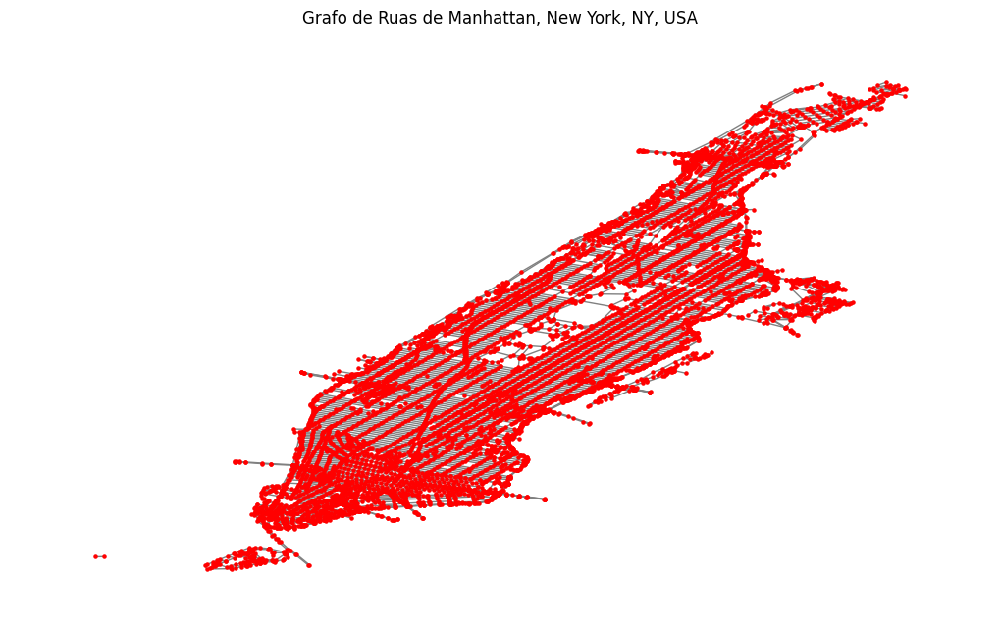

In [7]:
# O Grapho Completo
plot_graph(G,coords,node_color='red')

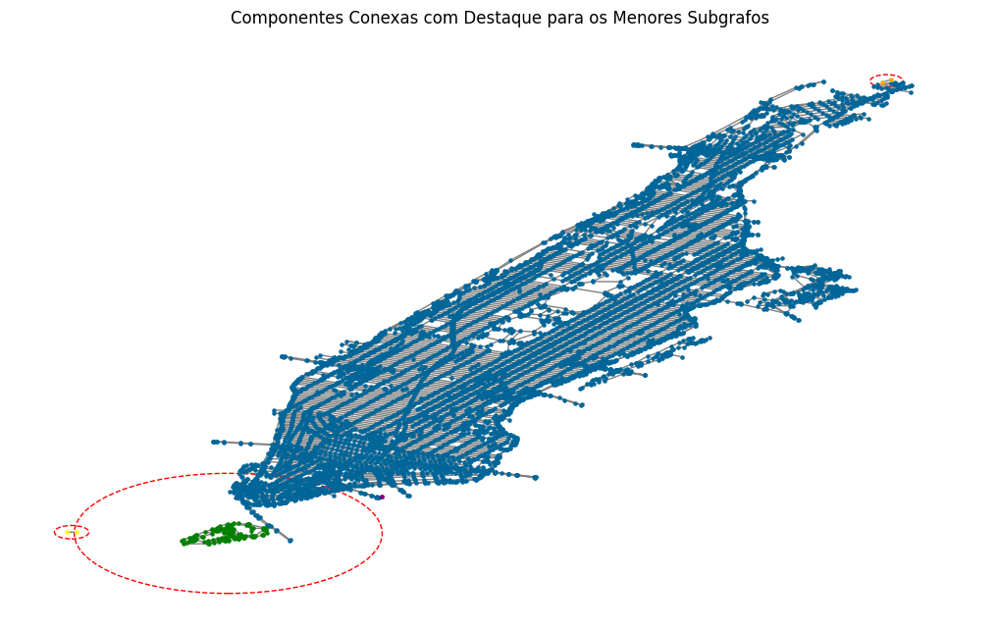

In [8]:
# Encontrar todas as componentes conexas no grafo original G
connected_components = list(nx.connected_components(G))

# Definir as cores para os subgrafos
colors = ['#006699', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown', 'black']
edge_color = 'gray'

# Identificar os tamanhos dos componentes
component_sizes = [len(component) for component in connected_components]

# Encontrar os subgrafos menores (aqueles que têm menos vértices que o maior componente)
sorted_components = sorted(connected_components, key=len, reverse=True)
largest_component = sorted_components[0]  # O maior componente
smaller_components = sorted_components[1:5]  # Os quatro menores

# PLOT SIZE (apenas um gráfico)
plt.figure(figsize=(10, 6))

# Para cada componente, desenhar no mesmo gráfico
for i, component in enumerate(connected_components):
    # FIX DATASET TO 0 AND 1 COLUMNS OF COORDINATES
    pos = {node: (coords.iloc[node, 0], coords.iloc[node, 1]) for node in component}

    # Desenhar o subgrafo
    nx.draw(G.subgraph(component).copy(), pos, node_size=5, edge_color=edge_color, node_color=colors[i % len(colors)], with_labels=False)

    # Destacar os subgrafos menores com círculos
    if component in smaller_components:
        # Coletar as coordenadas dos nós do subgrafo atual
        x_values = [coords.iloc[node, 0] for node in component]
        y_values = [coords.iloc[node, 1] for node in component]

        # Definir a região para o círculo ao redor do subgrafo
        x_center = sum(x_values) / len(x_values)
        y_center = sum(y_values) / len(y_values)
        radius = max(max(x_values) - min(x_values), max(y_values) - min(y_values)) * 1.8

        # Desenhar um círculo ao redor do subgrafo
        circle = plt.Circle((x_center, y_center), radius, color='red', fill=False, linewidth=1, linestyle='--')
        plt.gca().add_patch(circle)

# PLOT TITLE
plt.title("Componentes Conexas com Destaque para os Menores Subgrafos")

# PLOT SHOW
plt.show()

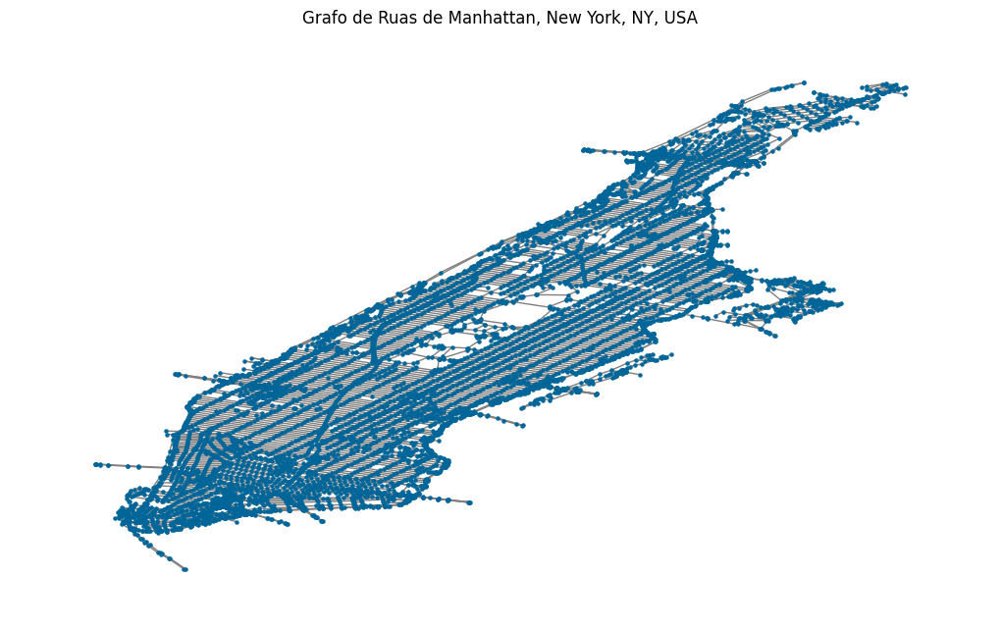

In [9]:
# O Maior Componente
G_largest = get_largest_component(G)
plot_graph(G_largest,coords,node_color='#006699')

# Selecionando de forma aleatória pontos ( 10 % ) do Grapho e atribuindo valores

In [10]:
#############################################
# SELECT_RANDOM_VERTICES
#############################################
def select_random_vertices(G, k):
    # Selecionar k vértices aleatórios do grafo
    return random.sample(list(G.nodes()), k)

In [11]:
selected_vertices = select_random_vertices(G_largest, k=870)
values = np.random.uniform(0, 40, size=len(selected_vertices))  # Valores sorteados de 0 a 10

# Construindo a Matriz Laplaciana do Grapho

In [12]:
#############################################
# LAPLACIAN MATRIX
#############################################
def construct_laplacian_matrix(G):
    return nx.laplacian_matrix(G)

L = construct_laplacian_matrix(G_largest)

# Construindo a Matriz de Penalidades

In [13]:
#############################################
# PENALTY MATRIX
#############################################
def construct_penalty_matrix(G, selected_vertices, penalty_value=1.0e7):
    n = len(G.nodes())  # Número de nós no grafo
    P = np.zeros((n, n))  # Inicializar a matriz de penalidades

    for v in selected_vertices:
        if v < n:  # Verificar se o índice está dentro dos limites
            P[v, v] = penalty_value
        else:
            print(f"Vértice {v} está fora dos limites da matriz (tamanho {n}). Ignorando.")

    return csr_matrix(P)

# Exemplo de uso
P = construct_penalty_matrix(G_largest, selected_vertices)

Vértice 8733 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8712 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8820 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8801 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8731 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8797 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8800 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8810 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8756 está fora dos limites da matriz (tamanho 8708). Ignorando.
Vértice 8795 está fora dos limites da matriz (tamanho 8708). Ignorando.


# Contruindo o vetor B

In [14]:
#############################################
# 4 - FOURTH STEP
#############################################
def construct_b_vector(G, selected_vertices, values):
    n = len(G.nodes())
    b = np.zeros(n)

    # Mapeamento de vértices para índices
    node_to_index = {node: i for i, node in enumerate(G.nodes())}

    # Atribuir valores de b para os vértices selecionados
    for i, v in enumerate(selected_vertices):
        if v in node_to_index:  # Verifica se o nó está no subgrafo
            b[node_to_index[v]] = values[i]  # Usar o índice correto

    return b

b = construct_b_vector(G_largest, selected_vertices, values)

# Resolvendo o Sistema

In [15]:
import time
import tracemalloc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.sparse.linalg import splu, cg
from sksparse.cholmod import cholesky
from scipy.linalg import qr
from IPython.display import display

# Função Jacobi
def solve_jacobi(A, b, max_iterations=1000, tolerance=1e-10):
    x = np.zeros_like(b)
    D_inv = np.diag(1 / np.diag(A))
    R = A - np.diagflat(np.diag(A))

    for i in range(max_iterations):
        x_new = np.dot(D_inv, b - np.dot(R, x))
        if np.linalg.norm(x_new - x, ord=np.inf) < tolerance:
            return x_new, i + 1  # Retornar solução e quantidade de iterações
        x = x_new

    return x, max_iterations  # Caso não converja, retorna o número máximo de iterações

# Função Gauss-Seidel
def solve_gauss_seidel(A, b, max_iterations=1000, tolerance=1e-10):
    x = np.zeros_like(b)
    n = len(b)

    for i in range(max_iterations):
        x_new = np.copy(x)
        for j in range(n):
            sum1 = np.dot(A[j, :j], x_new[:j])
            sum2 = np.dot(A[j, j+1:], x[j+1:])
            x_new[j] = (b[j] - sum1 - sum2) / A[j, j]

        if np.linalg.norm(x_new - x, ord=np.inf) < tolerance:
            return x_new, i + 1  # Retornar solução e quantidade de iterações
        x = x_new

    return x, max_iterations  # Caso não converja, retorna o número máximo de iterações

# Função QR
def solve_qr(A, b):
    Q, R = qr(A.toarray())  # A deve ser convertida para uma matriz densa
    return np.linalg.solve(R, np.dot(Q.T, b))

# Função para resolver o sistema com diferentes métodos
def solve_system(L, P, b, method='lu'):
    A = L + P
    n = A.shape[0]

    if method == 'lu':
        lu = splu(A.tocsc())
        flops = (2 / 3) * n**3  # FLOPs para LU
        return lu.solve(b), None, flops
    elif method == 'cholesky':
        L = cholesky(A.tocsc())  # Calcula a fatoração
        flops = (1 / 3) * n**3  # FLOPs para Cholesky
        return L(b), None, flops  # Resolve o sistema
    elif method == 'jacobi':
        x, iterations = solve_jacobi(A.toarray(), b)  # A deve ser densa para o método Jacobi
        flops = 2 * n**2 * iterations  # FLOPs para Jacobi
        return x, iterations, flops
    elif method == 'gauss_seidel':
        x, iterations = solve_gauss_seidel(A.toarray(), b)  # A deve ser densa para Gauss-Seidel
        flops = 2 * n**2 * iterations  # FLOPs para Gauss-Seidel
        return x, iterations, flops
    elif method == 'qr':
        x = solve_qr(A, b)  # Método QR
        flops = 4 * n**3  # FLOPs para QR
        return x, None, flops
    elif method == 'conjugate_gradient':
        x, iterations = cg(A, b)
        iterations = max(iterations, 1)  # Garantir pelo menos 1 iteração
        flops = 10 * n**2 * iterations  # FLOPs aproximados para CG
        return x, iterations, flops

# Função para medir o tempo de execução, uso de memória e calcular FLOPs
def measure_performance(L, P, b, method):
    start_time = time.time()
    tracemalloc.start()

    # Resolver o sistema
    x_solved, iterations, flops = solve_system(L, P, b, method=method)

    current, peak = tracemalloc.get_traced_memory()
    tracemalloc.stop()

    elapsed_time = time.time() - start_time
    memory_usage = peak / (1024 * 1024)

    return elapsed_time, iterations, memory_usage, flops, x_solved

# Testar vários métodos de solução e armazenar resultados
results = []
x_solved_array = []  # Array para armazenar soluções com o nome do método
#methods = ['lu', 'cholesky', 'conjugate_gradient', 'jacobi', 'gauss_seidel', 'qr']
methods = ['lu', 'cholesky', 'conjugate_gradient', 'qr']

for method in methods:
    elapsed_time, iterations, memory_usage, flops, x_solved = measure_performance(L, P, b, method)
    results.append({
        "Método": method,
        "Tempo (s)": elapsed_time,
        "Iterações": iterations if iterations is not None else "N/A",
        "Memória (MB)": memory_usage,
        "FLOPs": flops
    })
    x_solved_array.append({
        "method": method,
        "solution": x_solved
    })

# Criar um DataFrame com os resultados e exibir
df_results = pd.DataFrame(results)
display(df_results)

# Comparação de Erros Residuais
errors = []
A = L + P  # A matriz total

# Iterar sobre o array de soluções
for result in x_solved_array:
    method = result["method"]
    x = result["solution"]
    error = np.linalg.norm(A.dot(x) - b)  # Calcular o erro residual
    errors.append({
        "Método": method,
        "Erro Residual": error
    })

# Criar DataFrame de erros e exibir
df_errors = pd.DataFrame(errors)
display(df_errors)

<ipython-input-15-869092994a10>:58: CholmodTypeConversionWarning: converting matrix of class csc_array to CSC format
  L = cholesky(A.tocsc())  # Calcula a fatoração


,Método,Tempo (s),Iterações,Memória (MB),FLOPs
0,lu,0.051217,N/A,1.584266,4.402142e+11
1,cholesky,0.029765,N/A,1.579999,2.201071e+11
2,conjugate_gradient,0.085719,1,0.978911,7.582926e+08
3,qr,130.504903,N/A,3474.158213,2.641285e+12


,Método,Erro Residual
0,lu,6.904703e-13
1,cholesky,6.371224e-13
2,conjugate_gradient,6.472827e-03
3,qr,2.021537e-12


In [16]:
#Memória e CPU do ambiente Colab para documentação
!cat /proc/cpuinfo
!free -m


processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2200.140
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed bhi
bogomips	: 4400.28
clflush size	: 64
cache_alignment	: 64
ad

# Analisando os resultados obtidos após a resolução do sistema

In [17]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def plot_graph_with_selected_values(G, coords, selected_vertices, values, colormap='coolwarm',title='Mapa de Temperatura'):
    # Posição dos nós
    pos = {node: (coords.iloc[node, 0], coords.iloc[node, 1]) for node in G.nodes()}

    # PLOT SIZE (ajustado para remover bordas e aumentar o gráfico)
    plt.figure(figsize=(12, 8))

    # Todos os nós (não selecionados)
    non_selected_nodes = set(G.nodes()) - set(selected_vertices)

    # Desenhar os nós não selecionados (com transparência e tamanho reduzido)
    nx.draw_networkx_nodes(G, pos, nodelist=non_selected_nodes, node_color='lightgray', node_size=0.5, alpha=0.5)

    # Desenhar as arestas com opacidade reduzida
    nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

    # Usar uma escala de cores para os nós selecionados com base nos valores
    norm = mcolors.Normalize(vmin=min(values), vmax=max(values))
    cmap = cm.get_cmap(colormap)
    node_colors = [cmap(norm(value)) for value in values]

    # Desenhar os nós selecionados com cores baseadas nos valores sorteados
    nx.draw_networkx_nodes(G, pos, nodelist=selected_vertices, node_color=node_colors, node_size=30, alpha=0.9)

    # Adicionar rótulos apenas para os nós selecionados mais relevantes (limitar quantidade)
    labels = {node: f'{value:.2f}' for node, value in zip(selected_vertices, values)}
    if len(labels) > 50:  # Limitar rótulos para não sobrecarregar
        labels = {node: labels[node] for i, node in enumerate(labels) if i % (len(labels) // 50) == 0}

    # Desenhar os rótulos (com fonte menor)
    nx.draw_networkx_labels(G, pos, labels, font_size=6, font_color='black')

    # Adicionar uma barra de cores (colorbar) para indicar o mapeamento dos valores
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array(values)

    # Reduzir o tamanho da colorbar (shrink) e ajustá-la
    cbar = plt.colorbar(sm, shrink=0.7, pad=0.02, aspect=30)  # Shrink para diminuir o tamanho
    cbar.set_label('Temperatura')  # Rótulo da barra

    # Adicionar o título
    plt.title(title, fontsize=14, pad=15)

    # Remover bordas e ajustar o layout para expandir o gráfico
    plt.axis('off')
    plt.tight_layout()

    # Mostrar o gráfico
    plt.show()

# Exemplo de uso com a escala de azul para vermelho ('coolwarm'):
# plot_graph_with_selected_values(G_largest, coords, selected_vertices, values, colormap='coolwarm')

# Exemplo de uso com a escala de amarelo para vermelho ('YlOrRd'):
# plot_graph_with_selected_values(G_largest, coords, selected_vertices, values, colormap='YlOrRd')


<ipython-input-17-8ab2c4cd6869>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)
<ipython-input-17-8ab2c4cd6869>:43: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, shrink=0.7, pad=0.02, aspect=30)  # Shrink para diminuir o tamanho


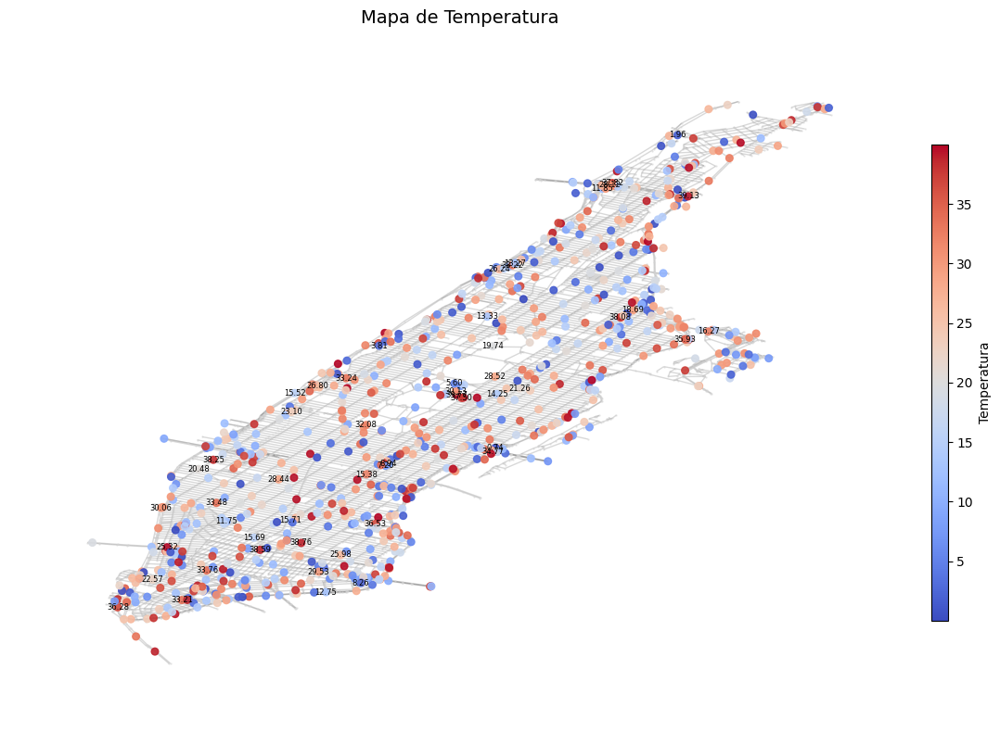

In [18]:
plot_graph_with_selected_values(G_largest, coords, selected_vertices, values)

In [19]:
def print_b_vector(b, selected_vertices, values):
    # Criar um DataFrame com os vértices e seus valores
    data = {
        'Vértice': selected_vertices,
        'Valor Atribuído': [f"{value:.2f}" for value in values]
    }

    df = pd.DataFrame(data)

    # Exibir a tabela
    print("Tabela com os valores atribuídos aos vértices:")
    display(df)

    print("Outros vértices têm valores 0.")

In [20]:
# Exemplo de uso
print_b_vector(b, selected_vertices, values)

Tabela com os valores atribuídos aos vértices:


,Vértice,Valor Atribuído
0,7357,15.71
1,5912,7.57
2,2955,27.07
3,6667,25.18
4,1641,15.22
...,...,...
865,7716,34.33
866,7531,29.74
867,4653,30.06
868,857,21.23


Outros vértices têm valores 0.


In [21]:
def print_penalty_matrix(P):
    print("Matriz de Penalidade P:")

    # Converter a matriz esparsa para densa
    P_dense = P.toarray()

    # Criar um DataFrame do Pandas para exibir a matriz
    df = pd.DataFrame(P_dense)

    # Exibir a tabela
    display(df)

In [22]:
print_penalty_matrix(P)

Matriz de Penalidade P:


,0,1,2,3,4,5,6,7,8,9,...,8698,8699,8700,8701,8702,8703,8704,8705,8706,8707
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8703,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8704,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import random

def plot_graph_with_selected_and_solved_values(G, coords, selected_vertices, values, x_solved):
    # Posição dos nós
    pos = {node: (coords.iloc[node, 0], coords.iloc[node, 1]) for node in G.nodes()}

    # PLOT SIZE
    plt.figure(figsize=(12, 8))

    # Desenhar os nós não selecionados (cinza)
    non_selected_nodes = list(set(G.nodes()) - set(selected_vertices))
    nx.draw_networkx_nodes(G, pos, nodelist=non_selected_nodes, node_color='lightgray', node_size=10, alpha=0.5)

    # Desenhar as arestas
    nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

    # Usar uma escala de cores para os nós selecionados com base nos valores sorteados
    norm = mcolors.Normalize(vmin=min(values), vmax=max(values))
    cmap_selected = cm.get_cmap('coolwarm')  # Cores para os valores sorteados
    node_colors_selected = [cmap_selected(norm(value)) for value in values]

    # Desenhar os nós selecionados com cores baseadas nos valores sorteados
    nx.draw_networkx_nodes(G, pos, nodelist=selected_vertices, node_color=node_colors_selected, node_size=200, alpha=0.9, label="Valores Sorteados")

    # Usar uma escala de cores para os valores resolvidos
    norm_resolved = mcolors.Normalize(vmin=min(x_solved), vmax=max(x_solved))
    cmap_resolved = cm.get_cmap('YlOrRd')  # Cores para os valores resolvidos
    node_colors_resolved = [cmap_resolved(norm_resolved(x)) for x in x_solved]

    # Desenhar todos os nós com valores resolvidos
    nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=node_colors_resolved, node_size=5, alpha=0.5, label="Valores Resolvidos")

    # Adicionar barra de cores para valores sorteados
    sm_selected = plt.cm.ScalarMappable(cmap=cmap_selected, norm=norm)
    sm_selected.set_array([])
    cbar_selected = plt.colorbar(sm_selected)
    cbar_selected.set_label('Valores Sorteados')

    # Adicionar barra de cores para valores resolvidos
    sm_resolved = plt.cm.ScalarMappable(cmap=cmap_resolved, norm=norm_resolved)
    sm_resolved.set_array([])
    cbar_resolved = plt.colorbar(sm_resolved)
    cbar_resolved.set_label('Valores Resolvidos')

    # Adicionar título
    plt.title('Comparação entre Valores Sorteados e Resolvidos', fontsize=16)

    # Remover bordas e ajustar o layout
    plt.axis('off')
    plt.tight_layout()

    # Mostrar o gráfico
    plt.show()

def plot_graph_with_selected_and_solved_values_array(G, coords, selected_vertices, values, x_solved_array):
    # Posição dos nós
    pos = {node: (coords.iloc[node, 0], coords.iloc[node, 1]) for node in G.nodes()}

    for result in x_solved_array:
        method_name = result["method"]  # Nome do método
        x_solved = result["solution"]  # Solução associada

        # PLOT SIZE
        plt.figure(figsize=(12, 8))

        # Desenhar os nós não selecionados (cinza)
        non_selected_nodes = list(set(G.nodes()) - set(selected_vertices))
        nx.draw_networkx_nodes(G, pos, nodelist=non_selected_nodes, node_color='lightgray', node_size=10, alpha=0.5)

        # Desenhar as arestas
        nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.3)

        # Usar uma escala de cores para os nós selecionados com base nos valores sorteados
        norm = mcolors.Normalize(vmin=min(values), vmax=max(values))
        cmap_selected = cm.get_cmap('coolwarm')  # Cores para os valores sorteados
        node_colors_selected = [cmap_selected(norm(value)) for value in values]

        # Desenhar os nós selecionados com cores baseadas nos valores sorteados
        nx.draw_networkx_nodes(G, pos, nodelist=selected_vertices, node_color=node_colors_selected, node_size=200, alpha=0.9, label="Valores Sorteados")

        # Usar uma escala de cores para os valores resolvidos
        norm_resolved = mcolors.Normalize(vmin=min(x_solved), vmax=max(x_solved))
        cmap_resolved = cm.get_cmap('YlOrRd')  # Cores para os valores resolvidos
        node_colors_resolved = [cmap_resolved(norm_resolved(x)) for x in x_solved]

        # Desenhar todos os nós com valores resolvidos
        nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=node_colors_resolved, node_size=5, alpha=0.5, label="Valores Resolvidos")

        # Adicionar barra de cores para valores sorteados
        sm_selected = plt.cm.ScalarMappable(cmap=cmap_selected, norm=norm)
        sm_selected.set_array([])
        cbar_selected = plt.colorbar(sm_selected)
        cbar_selected.set_label('Valores Sorteados')

        # Adicionar barra de cores para valores resolvidos
        sm_resolved = plt.cm.ScalarMappable(cmap=cmap_resolved, norm=norm_resolved)
        sm_resolved.set_array([])
        cbar_resolved = plt.colorbar(sm_resolved)
        cbar_resolved.set_label('Valores Resolvidos')

        # Adicionar título com o nome do método
        plt.title(f'Comparação entre Valores Sorteados e Resolvidos - {method_name}', fontsize=16)

        # Remover bordas e ajustar o layout
        plt.axis('off')
        plt.tight_layout()

        # Mostrar o gráfico
        plt.show()


<ipython-input-23-2b703ab3546f>:79: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_selected = cm.get_cmap('coolwarm')  # Cores para os valores sorteados
<ipython-input-23-2b703ab3546f>:87: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_resolved = cm.get_cmap('YlOrRd')  # Cores para os valores resolvidos
<ipython-input-23-2b703ab3546f>:96: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar_selected = plt.color

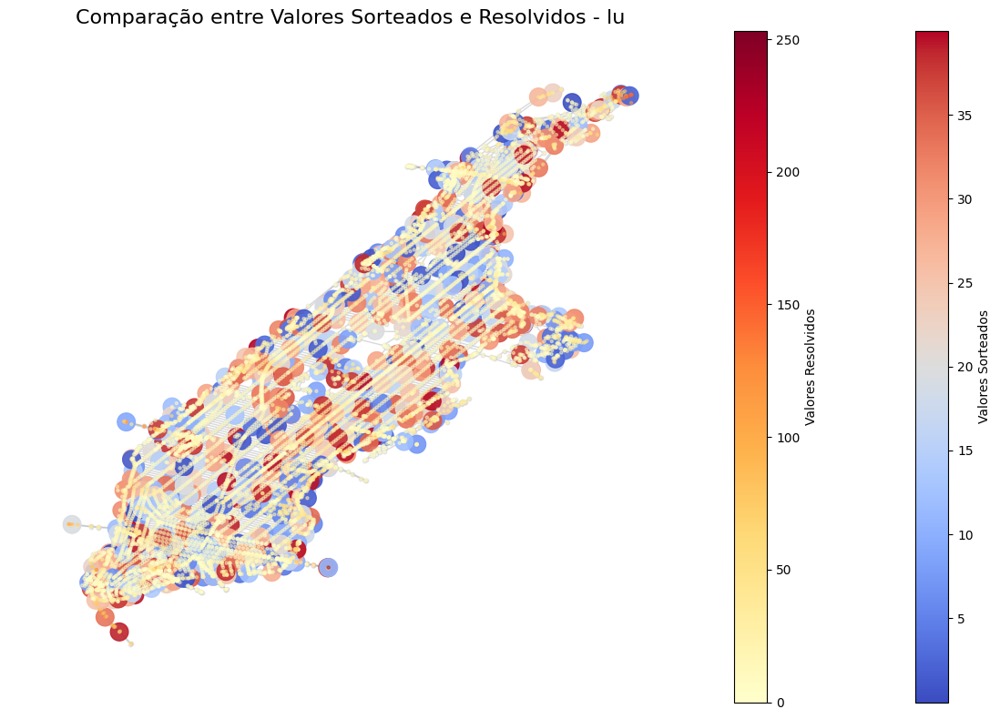

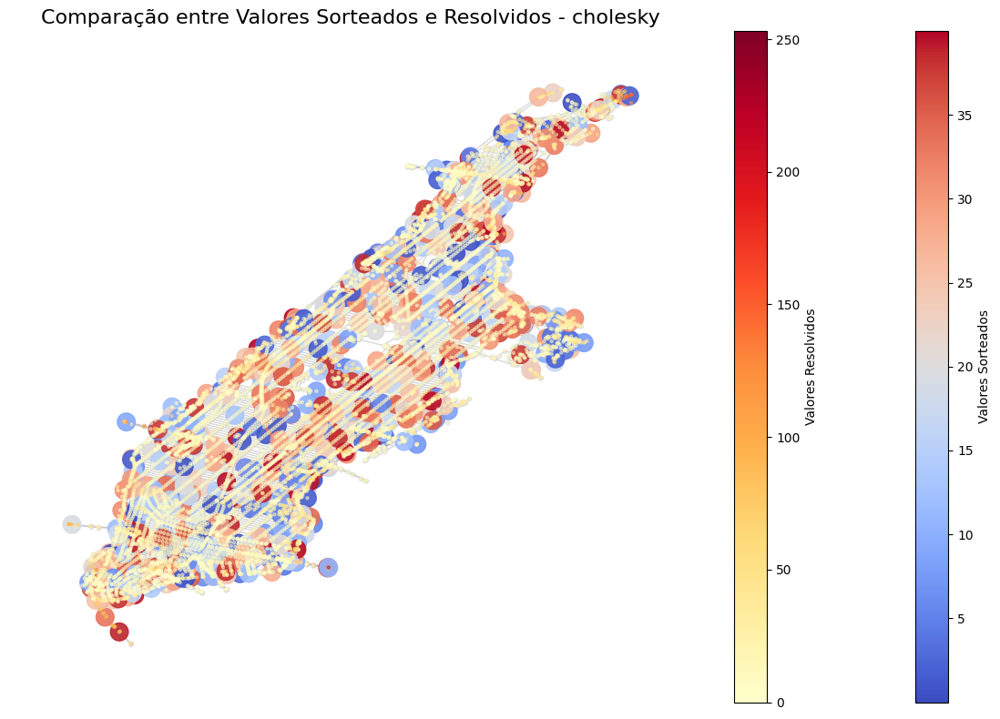

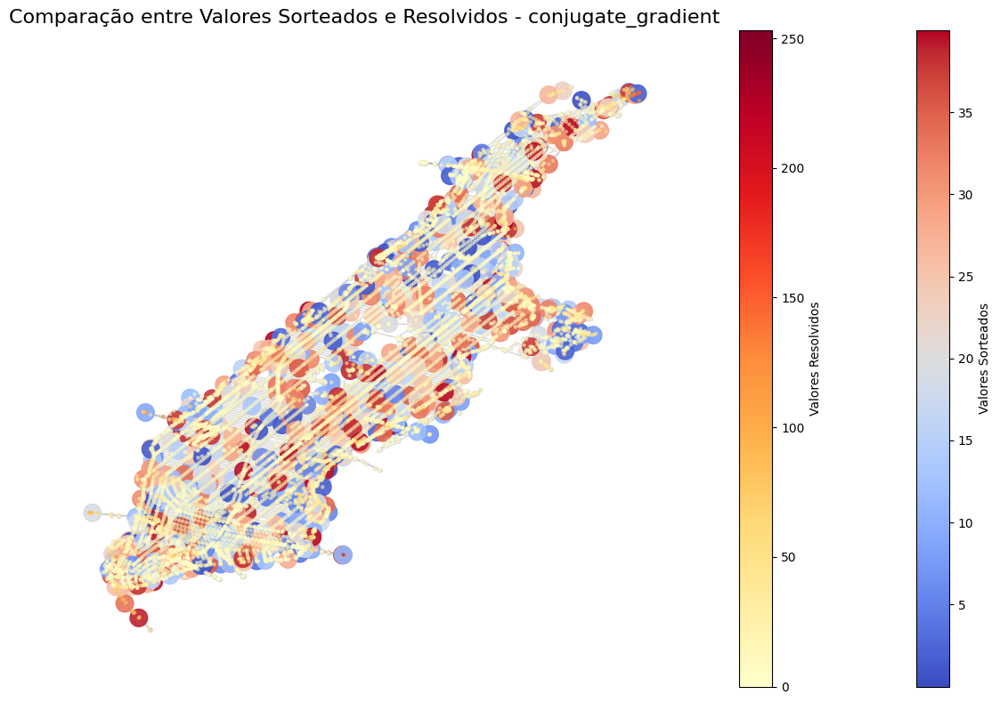

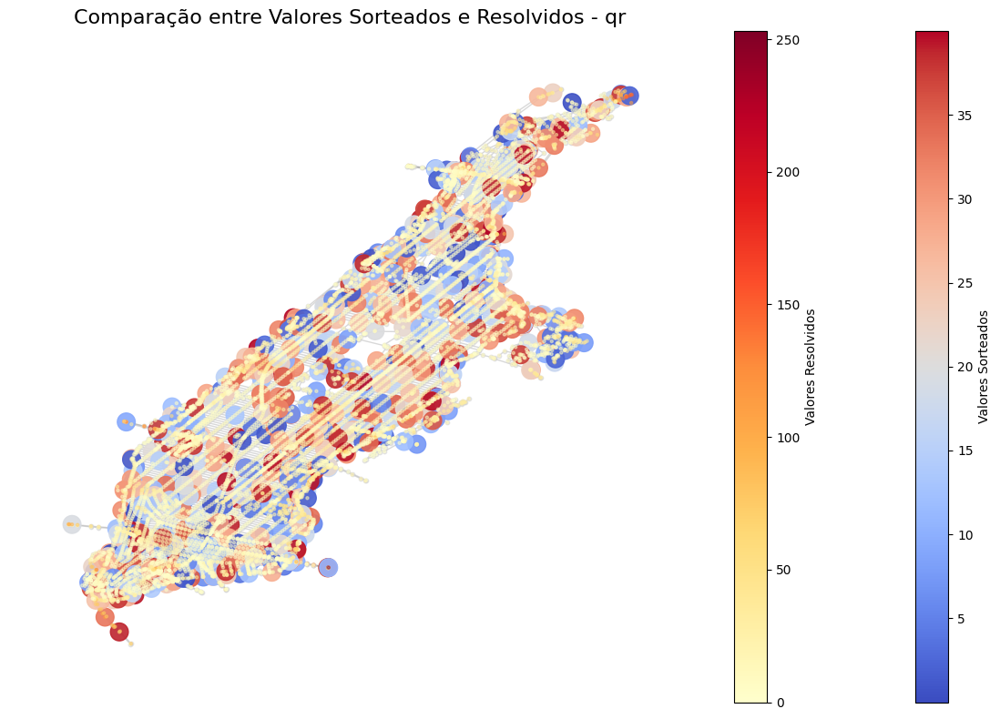

In [24]:
#for x_solved in x_solved_array:
#    plot_graph_with_selected_and_solved_values(G_largest,coords,selected_vertices,values,x_solved)
plot_graph_with_selected_and_solved_values_array(G_largest,coords,selected_vertices,values,x_solved_array)


In [25]:
def create_temperature_heatmap(coords, x_solved):
    # Criar um mapa centrado na cidade (coordenadas médias)
    latitude = coords.iloc[:, 1].mean()  # Supondo que a coluna 1 seja a latitude
    longitude = coords.iloc[:, 0].mean()  # Supondo que a coluna 0 seja a longitude
    city_map = folium.Map(location=[latitude, longitude], zoom_start=12, max_zoom=18)  # Ajustar o zoom inicial

    # Preparar os dados para o HeatMap
    heat_data = [[coords.iloc[i, 1], coords.iloc[i, 0], x_solved[i]] for i in range(len(x_solved))]

    # Adicionar o HeatMap ao mapa
    HeatMap(heat_data, radius=5, blur=1, max_zoom=18).add_to(city_map)  # Aumentar radius e blur

    # Salvar o mapa em um arquivo HTML
    city_map.save("temperature_heatmap.html")
    display(city_map)
    return city_map

In [26]:
create_temperature_heatmap(coords, x_solved_array[0]["solution"])

In [27]:
create_temperature_heatmap(coords, x_solved_array[1]["solution"])

In [28]:
create_temperature_heatmap(coords, x_solved_array[2]["solution"])

In [29]:
create_temperature_heatmap(coords, x_solved_array[3]["solution"])

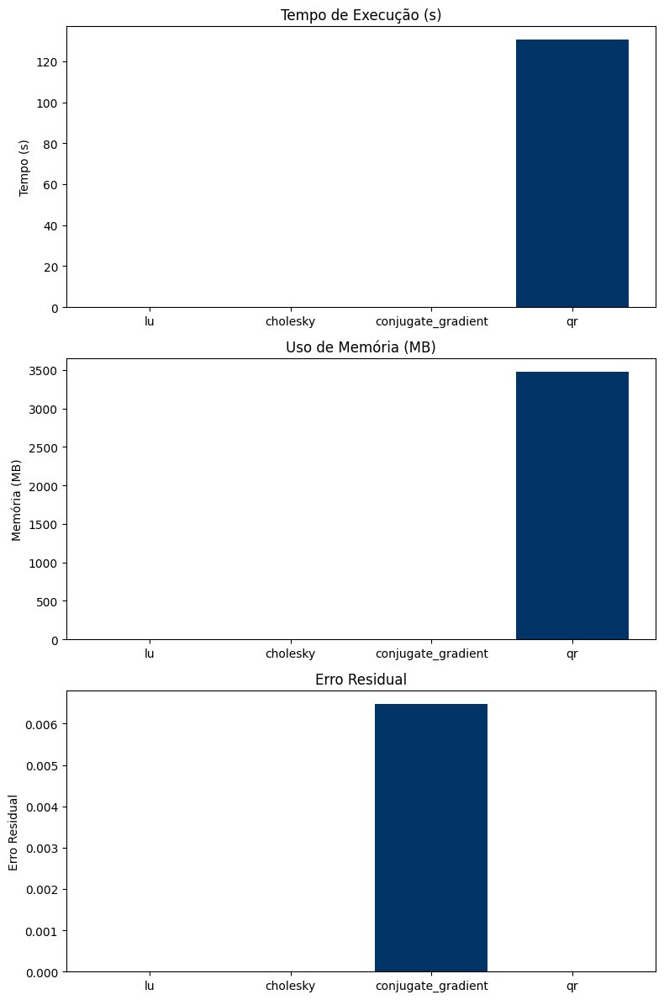

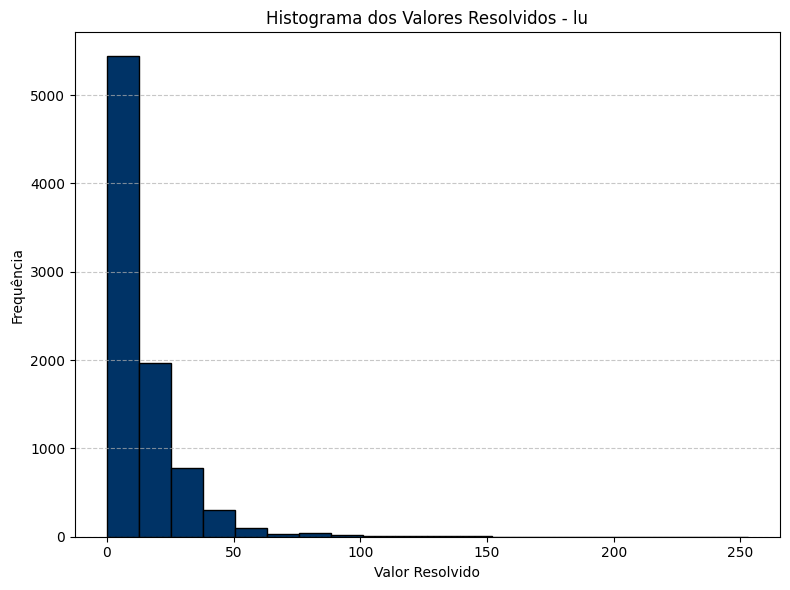

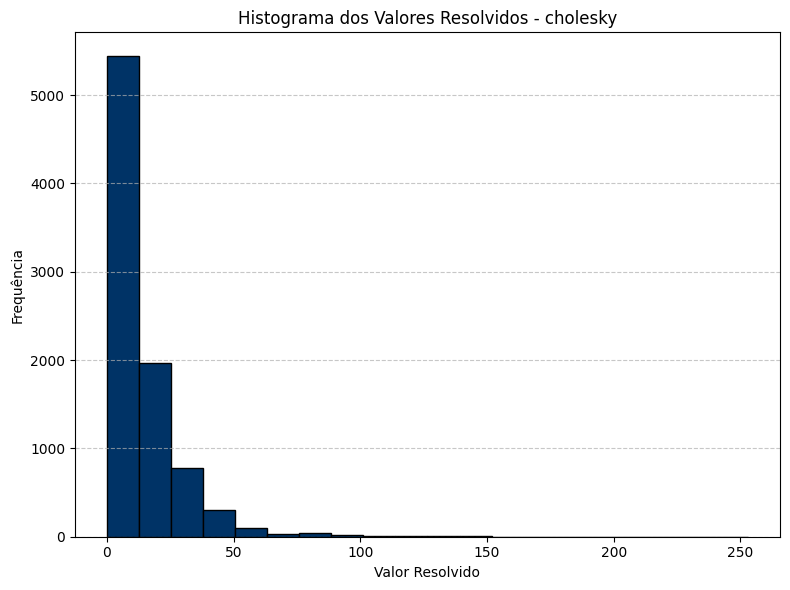

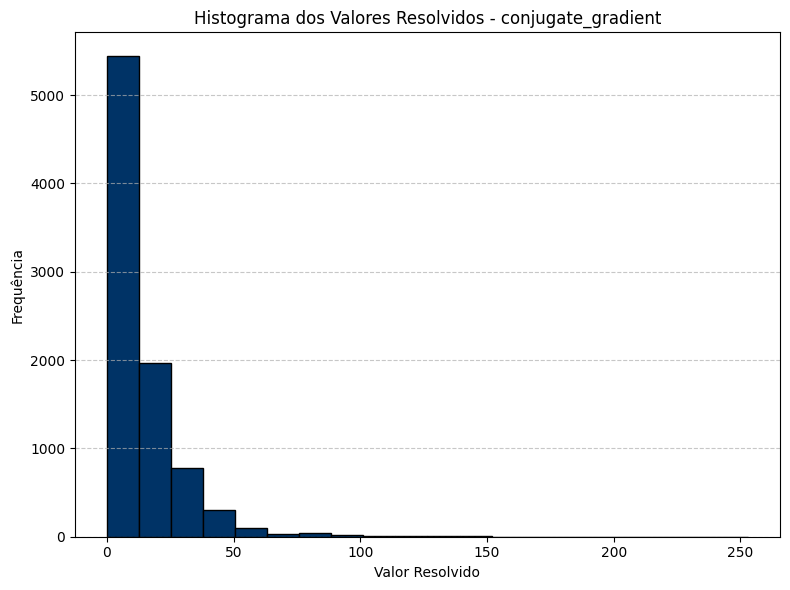

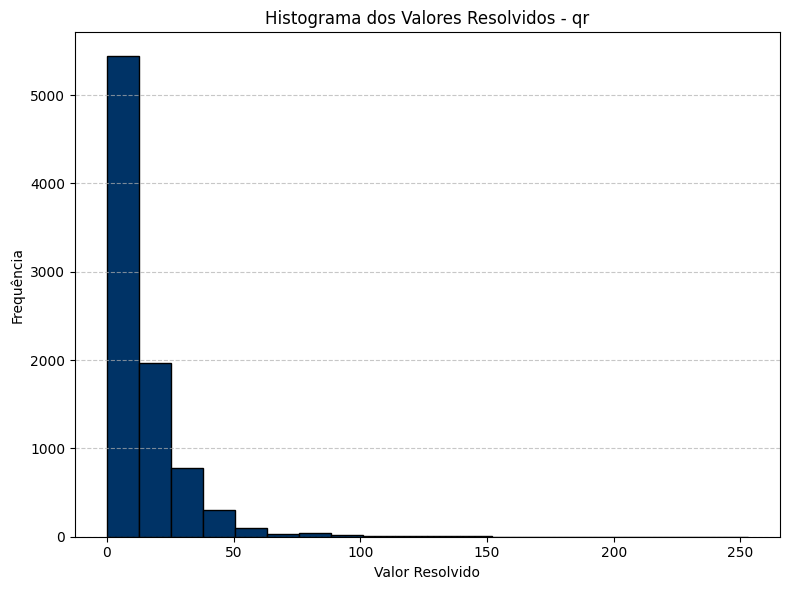

...

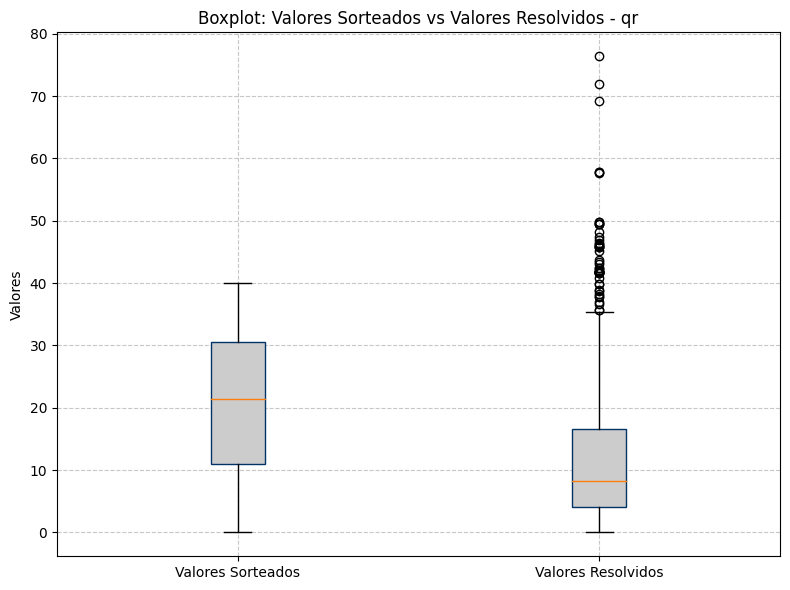

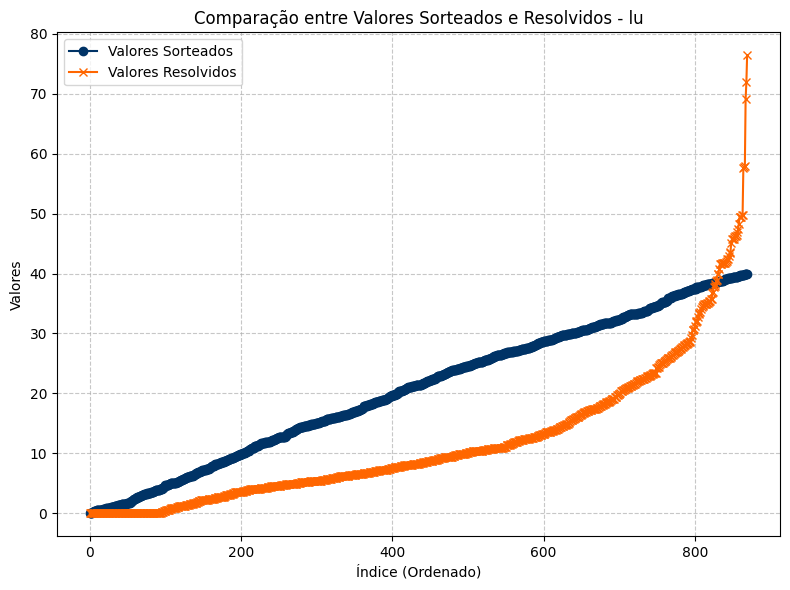

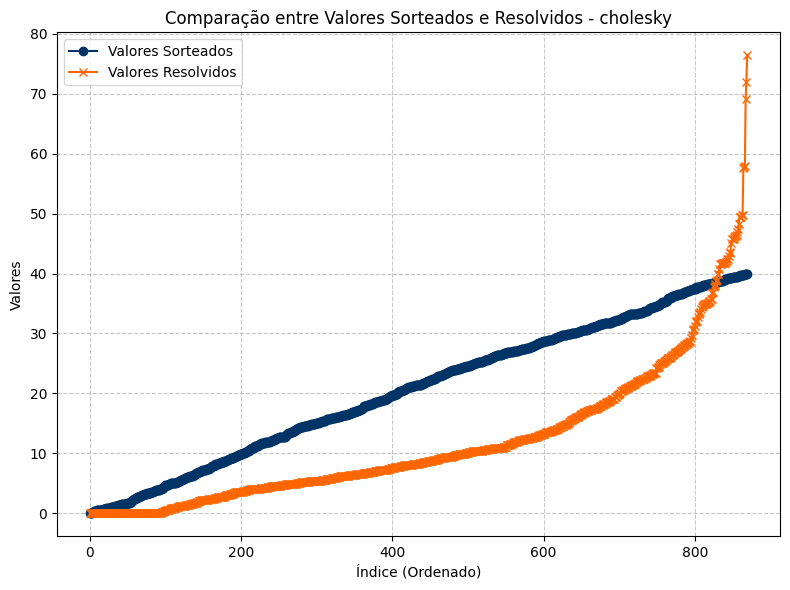

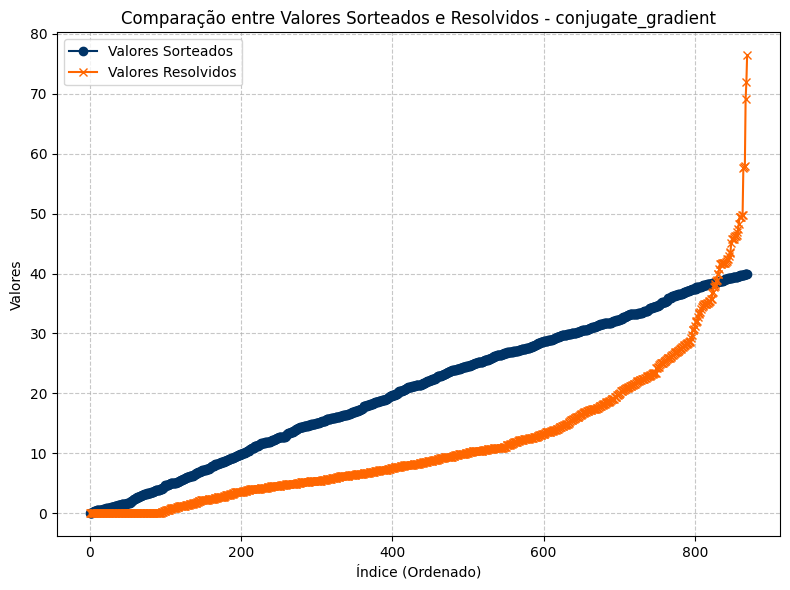

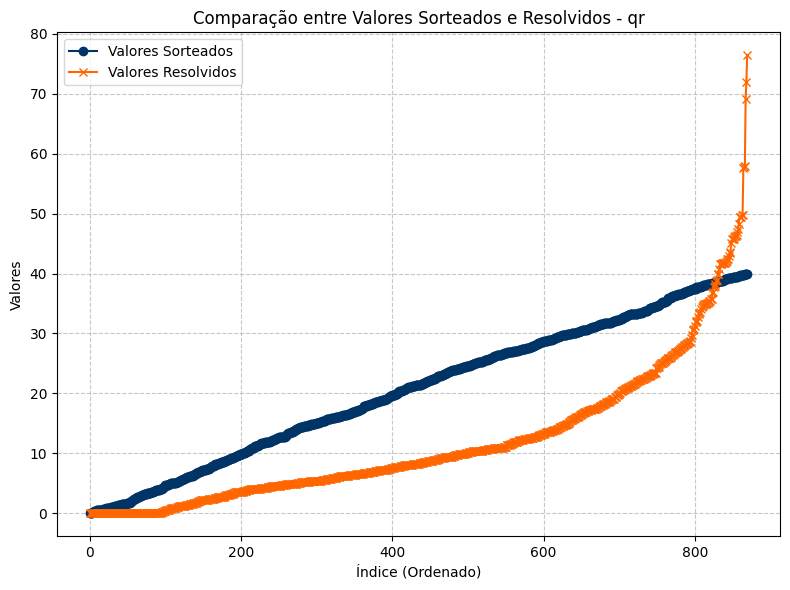

In [30]:
# Definindo a paleta de cores
colors = {
    'blue_dark': '#003366',
    'blue_light': '#006699',
    'blue': '#003366',
    'gray': '#CCCCCC',
    'gray_light': '#CCCCCC',
    'orange': '#FF6600',
    'green_dark': '#336633',
    'red': '#CC0000',
    'gray_dark': '#666666'
}

# Criando 3 subplots empilhados na vertical
fig, axs = plt.subplots(3, 1, figsize=(8, 12))  # 3 gráficos empilhados verticalmente

# Garantir que axs seja uma lista, mesmo que haja apenas um subplot
if not isinstance(axs, np.ndarray):
    axs = [axs]

# Gráfico de Tempo de Execução
axs[0].bar(df_results["Método"], df_results["Tempo (s)"], color=colors['blue'])
axs[0].set_title("Tempo de Execução (s)")
axs[0].set_ylabel("Tempo (s)")

# Gráfico de Uso de Memória
axs[1].bar(df_results["Método"], df_results["Memória (MB)"], color=colors['blue'])
axs[1].set_title("Uso de Memória (MB)")
axs[1].set_ylabel("Memória (MB)")

# Gráfico de Erro Residual
axs[2].bar(df_errors["Método"], df_errors["Erro Residual"], color=colors['blue'])
axs[2].set_title("Erro Residual")
axs[2].set_ylabel("Erro Residual")

# Ajustar o layout para evitar sobreposição
plt.tight_layout()
plt.show()


##

methods = ['lu', 'cholesky', 'conjugate_gradient', 'jacobi', 'gauss_seidel', 'qr']  # Lista com os nomes dos métodos

# Histograma dos Valores Resolvidos
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.figure(figsize=(8, 6))
    plt.hist(x_solved, bins=20, color=colors['blue'], edgecolor='black')
    plt.xlabel('Valor Resolvido')
    plt.ylabel('Frequência')
    plt.title(f'Histograma dos Valores Resolvidos - {method_name}')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Gráfico de Dispersão dos Valores Resolvidos
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.figure(figsize=(8, 6))
    plt.scatter(range(len(x_solved)), x_solved, color=colors['orange'], alpha=0.7)
    plt.xlabel('Índice do Vértice')
    plt.ylabel('Valor Resolvido')
    plt.title(f'Gráfico de Dispersão dos Valores Resolvidos - {method_name}')
    plt.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Gráfico de Linhas dos Valores Resolvidos
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.figure(figsize=(8, 6))
    plt.plot(x_solved, marker='o', linestyle='-', color=colors['blue'])  # Exemplo usando o primeiro método
    plt.xlabel('Índice do Vértice')
    plt.ylabel('Valor Resolvido')
    plt.title(f'Gráfico de Linhas dos Valores Resolvidos - {methods[0]}')
    plt.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Histograma de Comparação entre Valores Sorteados e Resolvidos
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.figure(figsize=(8, 6))
    plt.hist(values, bins=20, color=colors['blue'], label='Valores Sorteados', alpha=0.5)
    plt.hist(x_solved[:len(values)], bins=20, color=colors['orange'], label='Valores Resolvidos', alpha=0.5)
    plt.xlabel('Valores')
    plt.ylabel('Frequência')
    plt.title(f'Distribuição dos Valores Sorteados e Resolvidos - {method_name}')
    plt.legend(loc='upper right')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Boxplot: Comparação entre Valores Sorteados e Resolvidos
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.figure(figsize=(8, 6))
    plt.boxplot([values, x_solved[:len(values)]], labels=['Valores Sorteados', 'Valores Resolvidos'], patch_artist=True,
                boxprops=dict(facecolor=colors['gray'], color=colors['blue']))
    plt.ylabel('Valores')
    plt.title(f'Boxplot: Valores Sorteados vs Valores Resolvidos - {method_name}')
    plt.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Gráfico de Comparação entre Valores Sorteados e Resolvidos (ordenados)
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.figure(figsize=(8, 6))
    plt.plot(sorted(values), label='Valores Sorteados', marker='o', color=colors['blue'])
    plt.plot(sorted(x_solved[:len(values)]), label='Valores Resolvidos', marker='x', color=colors['orange'])
    plt.xlabel('Índice (Ordenado)')
    plt.ylabel('Valores')
    plt.title(f'Comparação entre Valores Sorteados e Resolvidos - {method_name}')
    plt.legend()
    plt.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


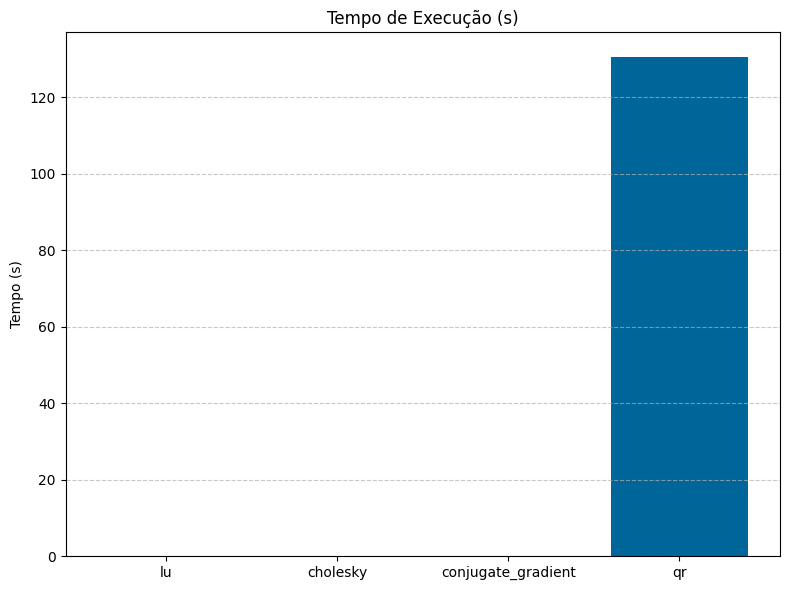

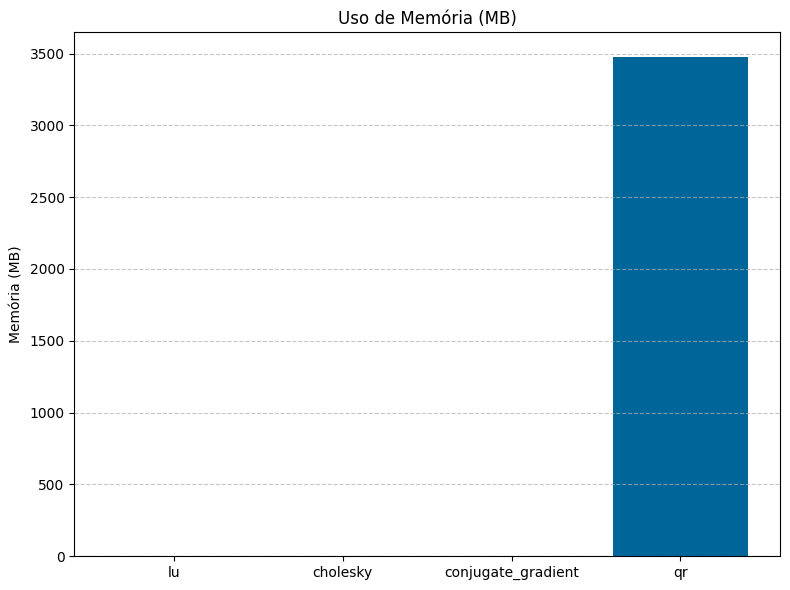

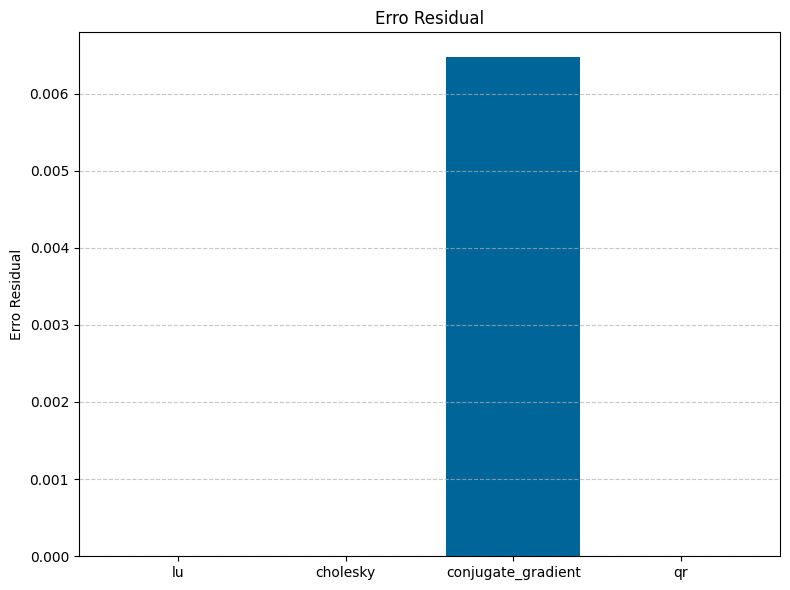

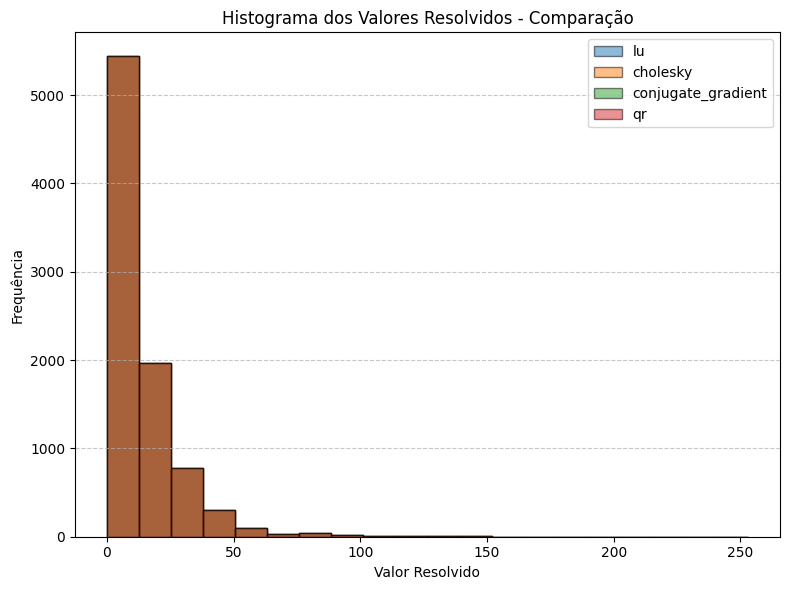

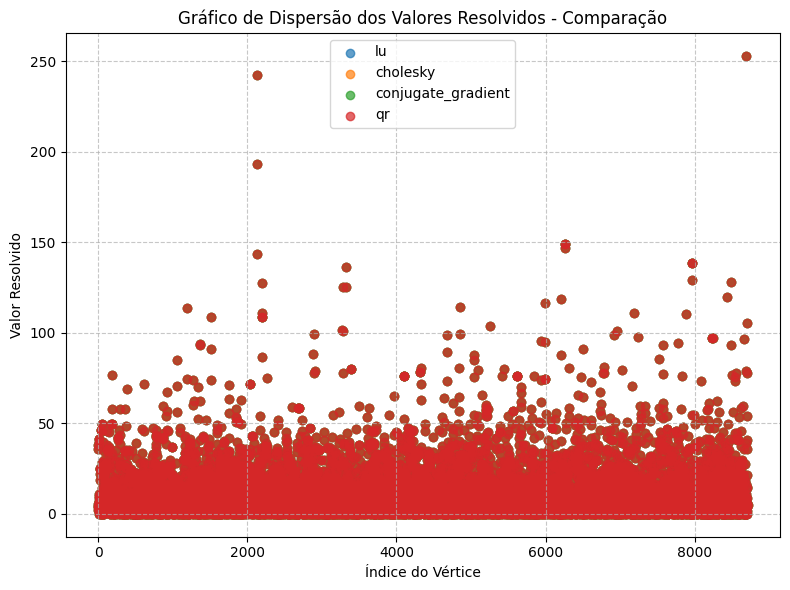

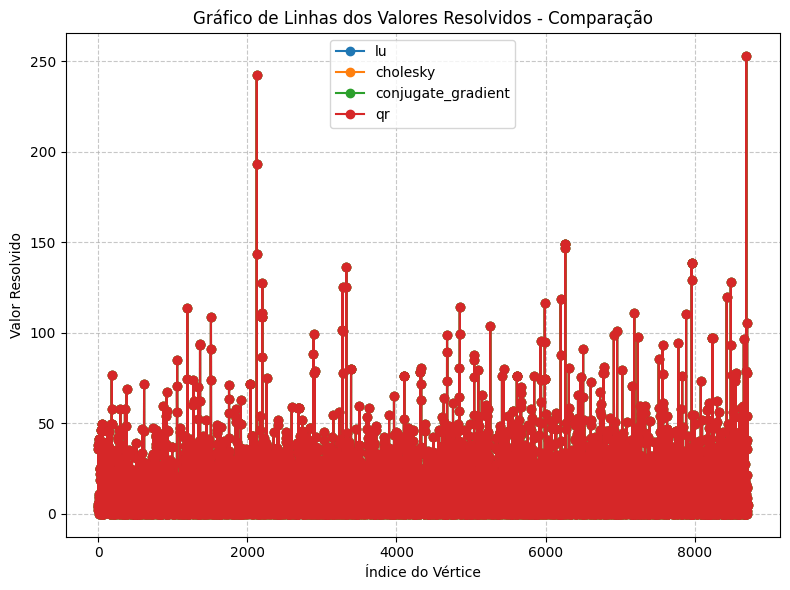

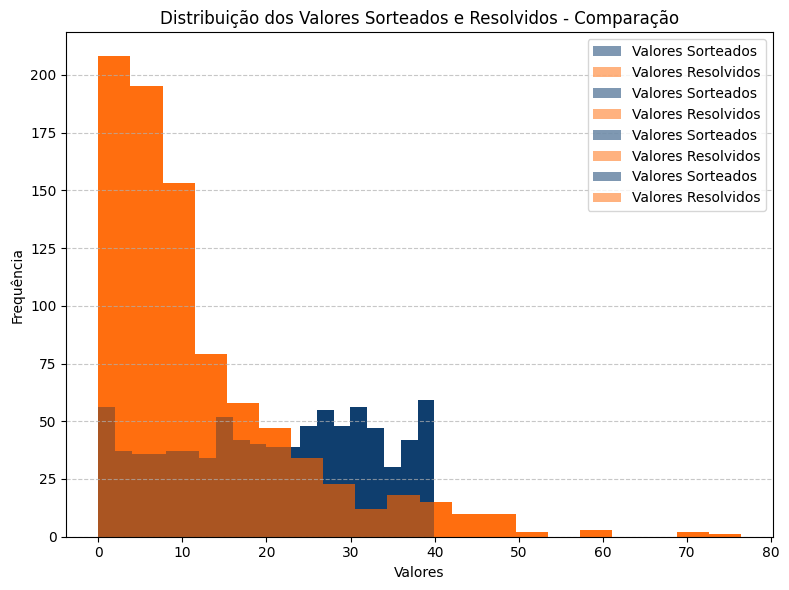

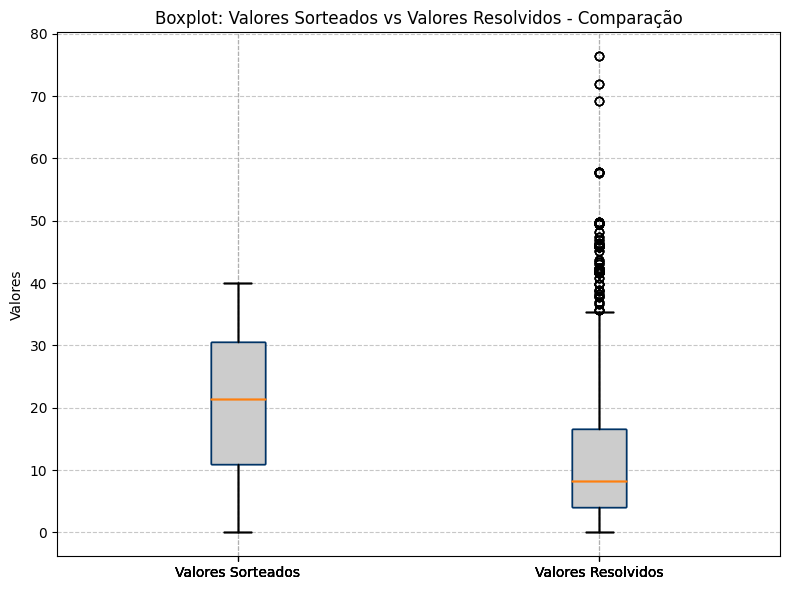

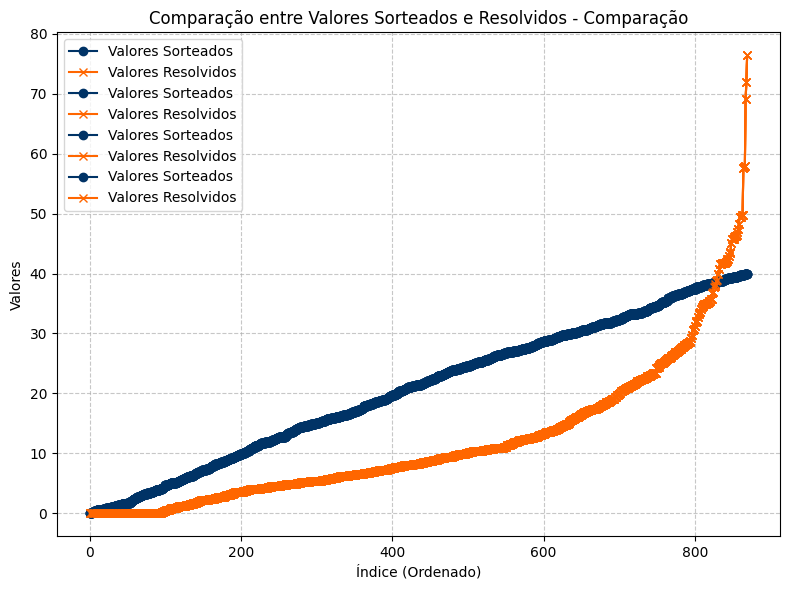

In [31]:
# Definindo a paleta de cores
colors = {
    'blue_dark': '#003366',
    'blue_light': '#006699',
    'blue': '#003366',
    'gray': '#CCCCCC',
    'gray_light': '#CCCCCC',
    'orange': '#FF6600',
    'green_dark': '#336633',
    'red': '#CC0000',
    'gray_dark': '#666666'
}
# Gráfico de Tempo de Execução
plt.figure(figsize=(8, 6))
for index, row in df_results.iterrows():
    plt.bar(row["Método"], row["Tempo (s)"], color=colors['blue_light'], label=row["Método"])
plt.title("Tempo de Execução (s)")
plt.ylabel("Tempo (s)")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Gráfico de Uso de Memória
plt.figure(figsize=(8, 6))
for index, row in df_results.iterrows():
    plt.bar(row["Método"], row["Memória (MB)"], color=colors['blue_light'], label=row["Método"])
plt.title("Uso de Memória (MB)")
plt.ylabel("Memória (MB)")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Gráfico de Erro Residual
plt.figure(figsize=(8, 6))
for index, row in df_errors.iterrows():
    plt.bar(row["Método"], row["Erro Residual"], color=colors['blue_light'], label=row["Método"])
plt.title("Erro Residual")
plt.ylabel("Erro Residual")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Histograma dos Valores Resolvidos - Comparação
plt.figure(figsize=(8, 6))
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.hist(x_solved, bins=20, alpha=0.5, label=method_name, edgecolor='black')
plt.xlabel('Valor Resolvido')
plt.ylabel('Frequência')
plt.title('Histograma dos Valores Resolvidos - Comparação')
plt.legend(loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Gráfico de Dispersão dos Valores Resolvidos - Comparação
plt.figure(figsize=(8, 6))
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.scatter(range(len(x_solved)), x_solved, alpha=0.7, label=method_name)
plt.xlabel('Índice do Vértice')
plt.ylabel('Valor Resolvido')
plt.title('Gráfico de Dispersão dos Valores Resolvidos - Comparação')
plt.legend()
plt.grid(linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Gráfico de Linhas dos Valores Resolvidos - Comparação
plt.figure(figsize=(8, 6))
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.plot(x_solved, marker='o', linestyle='-', label=method_name)  # Exemplo usando o primeiro método
plt.xlabel('Índice do Vértice')
plt.ylabel('Valor Resolvido')
plt.title('Gráfico de Linhas dos Valores Resolvidos - Comparação')
plt.legend()
plt.grid(linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Histograma de Comparação entre Valores Sorteados e Resolvidos
plt.figure(figsize=(8, 6))
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.hist(values, bins=20, color=colors['blue'], label='Valores Sorteados', alpha=0.5)
    plt.hist(x_solved[:len(values)], bins=20, color=colors['orange'], label='Valores Resolvidos', alpha=0.5)
plt.xlabel('Valores')
plt.ylabel('Frequência')
plt.title('Distribuição dos Valores Sorteados e Resolvidos - Comparação')
plt.legend(loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Boxplot: Comparação entre Valores Sorteados e Resolvidos
plt.figure(figsize=(8, 6))
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.boxplot([values, x_solved[:len(values)]], labels=['Valores Sorteados', 'Valores Resolvidos'], patch_artist=True,
                boxprops=dict(facecolor=colors['gray'], color=colors['blue']))
plt.ylabel('Valores')
plt.title('Boxplot: Valores Sorteados vs Valores Resolvidos - Comparação')
plt.grid(linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Gráfico de Comparação entre Valores Sorteados e Resolvidos (ordenados)
plt.figure(figsize=(8, 6))
for i, result in enumerate(x_solved_array):
    method_name = result["method"]  # Nome do método
    x_solved = result["solution"]  # Solução associada
    plt.plot(sorted(values), label='Valores Sorteados', marker='o', color=colors['blue'])
    plt.plot(sorted(x_solved[:len(values)]), label='Valores Resolvidos', marker='x', color=colors['orange'])
plt.xlabel('Índice (Ordenado)')
plt.ylabel('Valores')
plt.title('Comparação entre Valores Sorteados e Resolvidos - Comparação')
plt.legend()
plt.grid(linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [32]:
i=0
for x in x_solved_array[0]["solution"]:
    if x > 40:
        i=i+1
print(i)
#590 valores superiores

446


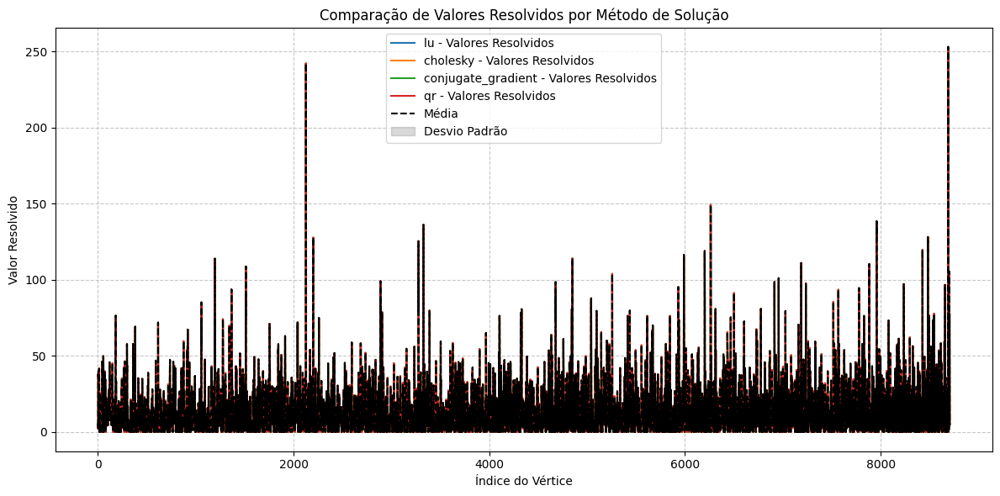

In [33]:

# Criar um DataFrame com os valores resolvidos para cada método
resolved_values = [result["solution"] for result in x_solved_array]

# Criar uma estrutura para armazenar médias e desvios padrões
mean_values = np.mean(resolved_values, axis=0)  # Média dos valores resolvidos
std_values = np.std(resolved_values, axis=0)    # Desvio padrão dos valores resolvidos

# Plotar os valores resolvidos
plt.figure(figsize=(12, 6))

# Gráfico de Linhas
for i, result in enumerate(x_solved_array):
    method_name = result["method"]
    plt.plot(result["solution"], label=f'{method_name} - Valores Resolvidos')

# Adicionar média e desvio padrão
plt.plot(mean_values, label='Média', linestyle='--', color='black')
plt.fill_between(range(len(mean_values)), mean_values - std_values, mean_values + std_values,
                 color='gray', alpha=0.3, label='Desvio Padrão')

# Personalizar o gráfico
plt.xlabel('Índice do Vértice')
plt.ylabel('Valor Resolvido')
plt.title('Comparação de Valores Resolvidos por Método de Solução')
plt.legend()
plt.grid(linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

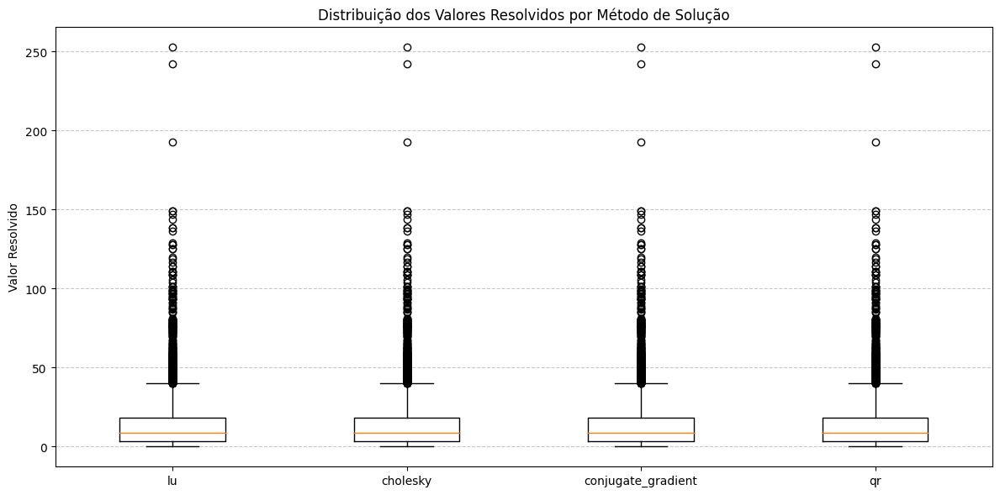

In [34]:

# Preparar os dados para o boxplot
resolved_values = [result["solution"] for result in x_solved_array]

# Criar boxplot
plt.figure(figsize=(12, 6))
plt.boxplot(resolved_values, labels=[result["method"] for result in x_solved_array])
plt.ylabel('Valor Resolvido')
plt.title('Distribuição dos Valores Resolvidos por Método de Solução')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [37]:
import folium
from folium.plugins import HeatMap

def create_temperature_heatmap(coords, x_solved, original_values):
    # Criar um mapa centrado na cidade (coordenadas médias)
    latitude = coords.iloc[:, 1].mean()  # Supondo que a coluna 1 seja a latitude
    longitude = coords.iloc[:, 0].mean()  # Supondo que a coluna 0 seja a longitude
    city_map = folium.Map(location=[latitude, longitude], zoom_start=12, max_zoom=18)  # Ajustar o zoom inicial

    # Preparar os dados para o HeatMap
    heat_data = [[coords.iloc[i, 1], coords.iloc[i, 0], x_solved[i]] for i in range(len(x_solved))]

    # Adicionar o HeatMap ao mapa
    HeatMap(heat_data, radius=5, blur=1, max_zoom=18).add_to(city_map)  # Aumentar radius e blur

    # Adicionar marcadores para os valores originais
    for i in range(len(original_values)):
        folium.Marker(
            location=[coords.iloc[i, 1], coords.iloc[i, 0]],
            popup=f'Valor Original: {original_values[i]}',
            icon=folium.Icon(color='red', icon='info-sign')  # Marcador vermelho
        ).add_to(city_map)

    # Salvar o mapa em um arquivo HTML
    city_map.save("temperature_heatmap.html")
    display(city_map)
    return city_map


create_temperature_heatmap(coords, x_solved, values)
